In [1]:
import pandas as pd
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
import cv2
import os
from pylab import rcParams
import PIL
from PIL import Image
from sklearn.model_selection import train_test_split
import imgaug as ia
import imgaug.augmenters as iaa

In [2]:
import sys
import random
import warnings

import math
from keras.callbacks import Callback
from keras.losses import binary_crossentropy
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from keras.layers import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam
from keras import backend as K
import joblib
import gc

In [3]:
raw_data = pd.read_csv('C:/Users/Ashvini Alashetty/Downloads/archive (2)/metadata.csv')
raw_data.head(5)

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
0,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
1,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
2,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
3,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
4,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...


In [4]:
img_size = 256

In [5]:
def clahe_enhancer(test_img, demo):

    test_img = test_img*255
    test_img = np.uint8(test_img)
    test_img_flattened = test_img.flatten()
  
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    clahe_image = clahe.apply(test_img)
    clahe_image_flattened = clahe_image.flatten()

    if demo == 1:

        fig = plt.figure()
        rcParams['figure.figsize'] = 10,10

        plt.subplot(2, 2, 1)
        plt.imshow(test_img, cmap='bone')
        plt.grid(False);
        plt.title("Original CT-Scan")

        plt.subplot(2, 2, 2)
        plt.hist(test_img_flattened)
        plt.grid(False);
        plt.title("Histogram of Original CT-Scan")

        plt.subplot(2, 2, 3)
        plt.imshow(clahe_image, cmap='bone')
        plt.grid(False);
        plt.title("CLAHE Enhanced CT-Scan")

        plt.subplot(2, 2, 4)
        plt.hist(clahe_image_flattened)
        plt.grid(False);
        plt.title("Histogram of CLAHE Enhanced CT-Scan")

    return(clahe_image)

In [27]:
def read_nii_demo(filepath, data, show_shape = False):
    
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    if (show_shape):
        print(array.shape)
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1], 1))

    # Min-max scaling
    for img_no in range(0, array.shape[0]):
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)
        data.append(img)

In [28]:
cts = []
lungs = []

In [29]:
for i in range(0, 20):
    if i == 0:
        read_nii_demo(raw_data.loc[i,'lung_mask'], lungs, True)
        read_nii_demo(raw_data.loc[i,'ct_scan'], cts, True) 
    else:
        read_nii_demo(raw_data.loc[i,'lung_mask'], lungs)
        read_nii_demo(raw_data.loc[i,'ct_scan'], cts) 

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  


In [30]:
new_cts = []
new_lungs = []

# CLAHE

In [31]:
for img_no in range(len(lungs)):

    lung_img = lungs[img_no]
    lung_img[lung_img>0]=1
    new_lungs.append(lung_img)

    cts_img = cts[img_no]
    cts_img = clahe_enhancer(cts_img, demo = 0)
    new_cts.append(cts_img)

(256, 256) (256, 256)


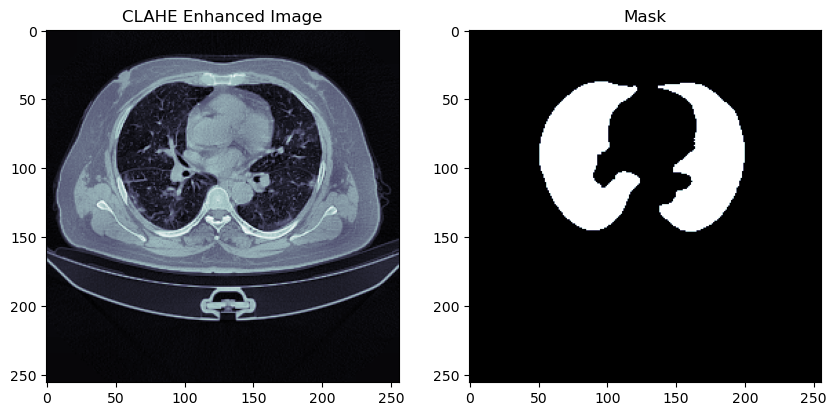

In [32]:
x = 100

rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(new_cts[x], cmap='bone')
plt.grid(False);
plt.title("CLAHE Enhanced Image")

plt.subplot(1, 2, 2)
plt.imshow(new_lungs[x], cmap='bone')
plt.grid(False);
plt.title("Mask")

print(cts[x].shape, lungs[x].shape)

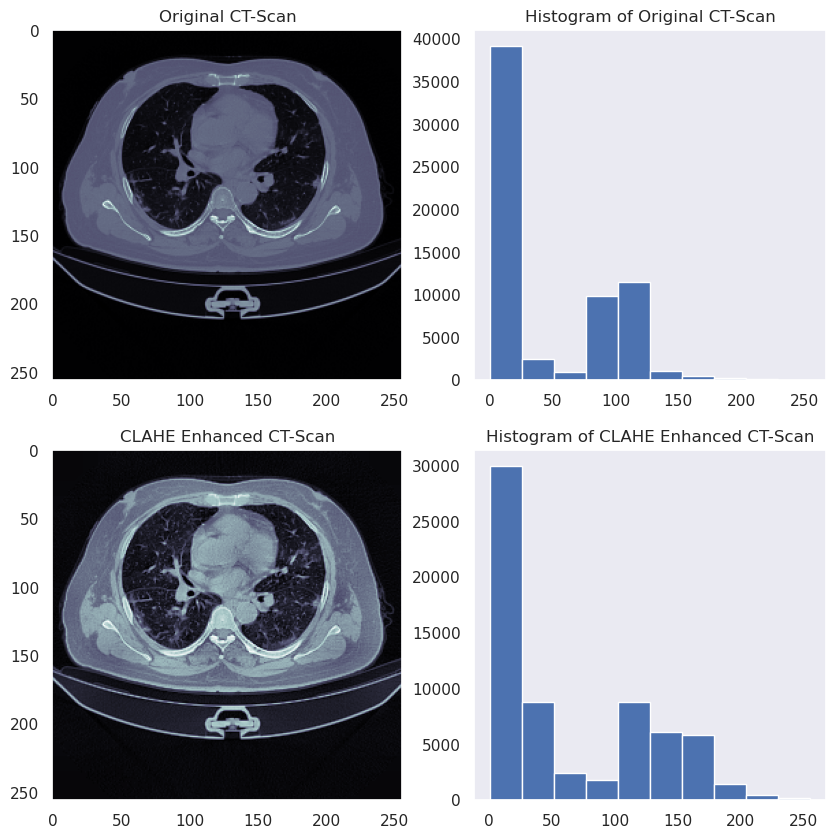

In [17]:
test_file = []
read_nii_demo(raw_data.loc[0,'ct_scan'], test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[100], demo = 1)

# Data augmentation

In [33]:
new_dim = 256

In [34]:
new_cts = np.array(new_cts)
new_lungs = np.array(new_lungs)

In [35]:
new_cts = np.uint8(new_cts)
new_lungs = np.uint8(new_lungs)

In [36]:
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Flipud(0.2), # vertically flip 20% of all images
    sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            rotate=(-30, 30), # rotate by -30 to +30 degrees
            shear=(-15, 15), # shear by -15 to +15 degrees
        ))
], random_order=True)

In [18]:
new_cts = new_cts.reshape(len(new_cts), new_dim, new_dim, 1)

In [37]:
new_lungs = new_lungs.reshape(len(new_lungs), new_dim, new_dim, 1)

In [22]:
len(new_cts) * 0.25

526.5

In [38]:
no_of_aug_imgs = 526
random_indices = np.random.randint(0, new_cts.shape[0], size=no_of_aug_imgs)
sample_new_cts = new_cts[random_indices]
sample_new_lungs = new_lungs[random_indices]

In [39]:
new_cts_aug, new_lungs_aug = seq(images=sample_new_cts, 
                              segmentation_maps=sample_new_lungs)


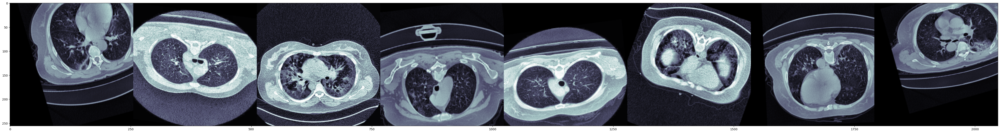

In [40]:
rcParams['figure.figsize'] = 60,60
rand = np.random.randint(0, no_of_aug_imgs, size=8)

cells1 = new_cts_aug[rand]
grid_image1 = np.hstack(cells1)
plt.imshow(grid_image1, cmap = 'bone')
plt.grid(False)

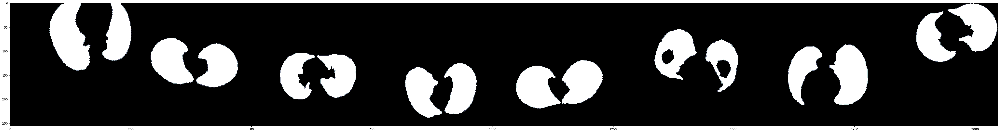

In [41]:
rcParams['figure.figsize'] = 60,60

cells1 = new_lungs_aug[rand]
grid_image1 = np.hstack(cells1)
plt.imshow(grid_image1, cmap = 'bone')
plt.grid(False)

In [23]:
print(new_cts_aug.shape, new_lungs_aug.shape)

(526, 256, 256, 1) (526, 256, 256, 1)


In [24]:
new_cts_aug = new_cts_aug.reshape(len(new_cts_aug), new_dim, new_dim, 1)
new_lungs_aug = new_lungs_aug.reshape(len(new_lungs_aug), new_dim, new_dim, 1)

In [25]:
new_cts = np.concatenate((new_cts, new_cts_aug))
new_lungs = np.concatenate((new_lungs, new_lungs_aug))

In [26]:
new_cts = new_cts/255

In [30]:
len(new_cts)

2632

In [52]:
def plot_sample(array_list, color_map = 'nipy_spectral'):
    
    fig = plt.figure(figsize=(10,30))

    plt.subplot(1,2,1)
    plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image')

    plt.subplot(1,2,2)
    plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
    plt.imshow(array_list[1].reshape(new_dim, new_dim), alpha=0.5, cmap=color_map)
    plt.title('Lung Mask')


    plt.show()

In [54]:
rcParams['axes.grid'] = False

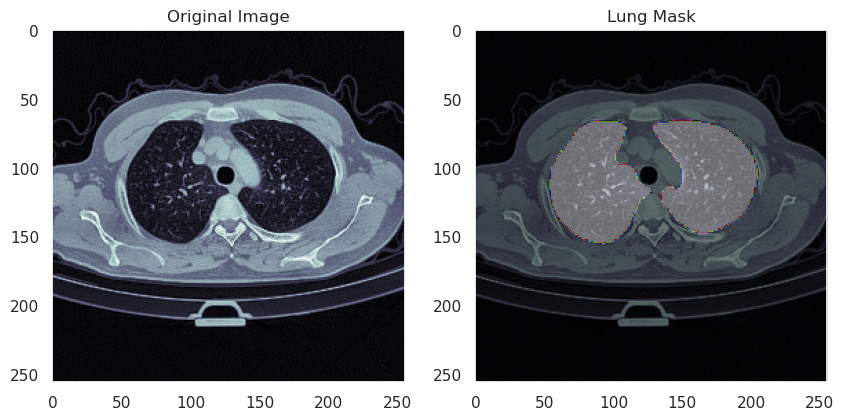

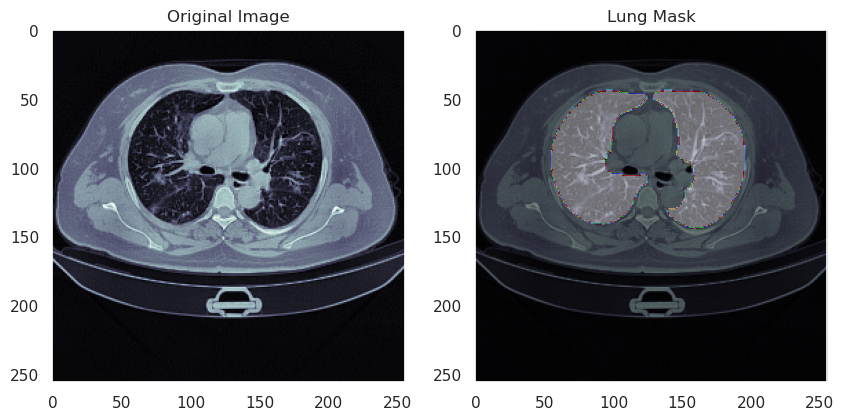

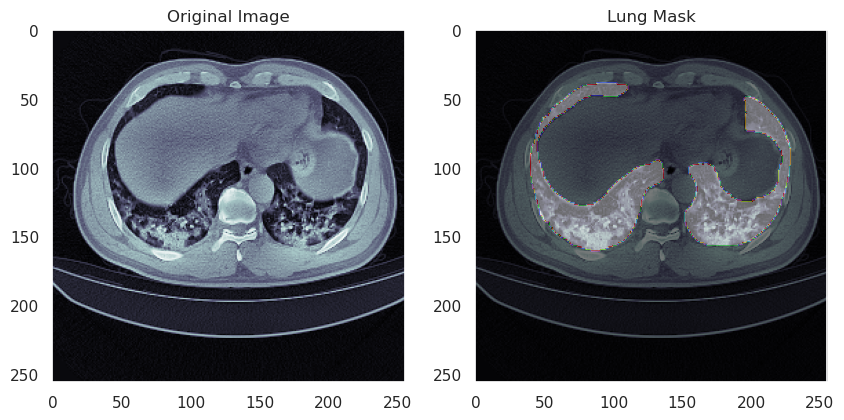

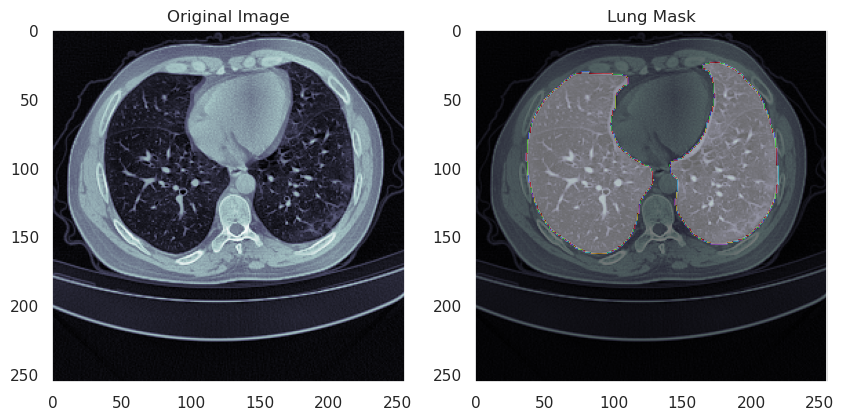

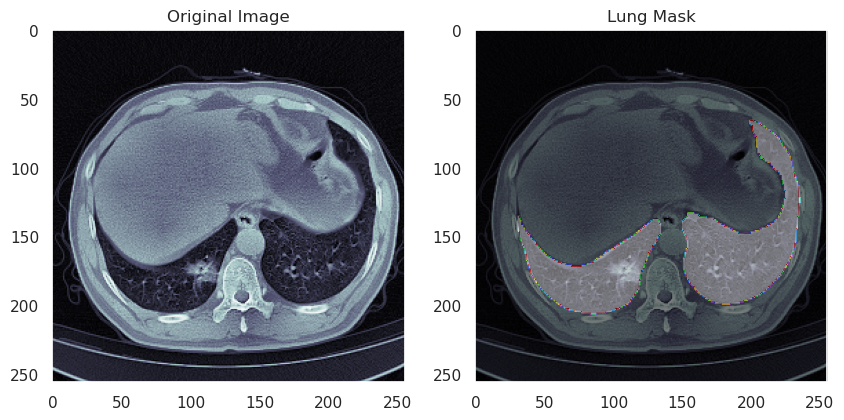

In [55]:
for index in [567,127,330,440,190]:
    plot_sample([new_cts[index], new_lungs[index]])

# Unet model

In [27]:
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss


def bce_dice_loss(y_true, y_pred):
    loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    return loss

In [28]:
inputs = Input((new_dim, new_dim, 1))
    
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (inputs)
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c1)
c1 = BatchNormalization()(c1)
p1 = MaxPooling2D((2, 2)) (c1)
p1 = Dropout(0.25)(p1)

c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p1)
c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c2)
c2 = BatchNormalization()(c2)
p2 = MaxPooling2D((2, 2)) (c2)
p2 = Dropout(0.25)(p2)

c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p2)
c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c3)
c3 = BatchNormalization()(c3)
p3 = MaxPooling2D((2, 2)) (c3)
p3 = Dropout(0.25)(p3)

c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p3)
c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c4)
c4 = BatchNormalization()(c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
p4 = Dropout(0.25)(p4)

c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p4)
c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c5)

u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = concatenate([u6, c4])
u6 = BatchNormalization()(u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c6)


u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
u7 = BatchNormalization()(u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c7)


u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
u8 = BatchNormalization()(u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c8)


u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
u9 = BatchNormalization()(u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

In [29]:
batch_size = 32
epochs = 50
filepath_dice_coeff="unet_covid_weights_dice_coeff.hdf5"
filepath_loss = "unet_covid_weights_val_loss.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [31]:
del new_cts_aug
del new_lungs_aug
del cts
del lungs
gc.collect()

7706

In [32]:
model.compile(optimizer=Adam(lr = 0.0001), loss=bce_dice_loss, metrics=[dice_coeff])

/opt/conda/lib/python3.7/site-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [33]:
new_lungs = new_lungs.astype(np.float32)

In [47]:
x_train, x_valid, y_train, y_valid = train_test_split(new_cts, new_lungs, test_size=0.2, random_state=42)

In [ ]:
results = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss])

Epoch 1/50


2023-04-07 12:38:12.996912: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


66/66 [==============================] - ETA: 0s - loss: 0.2692 - dice_coeff: 0.6548
Epoch 1: val_dice_coeff improved from -inf to 0.07170, saving model to unet_covid_weights_dice_coeff.hdf5

Epoch 1: val_loss improved from inf to 0.73136, saving model to unet_covid_weights_val_loss.hdf5
66/66 [==============================] - 99s 1s/step - loss: 0.2692 - dice_coeff: 0.6548 - val_loss: 0.7314 - val_dice_coeff: 0.0717
Epoch 2/50
66/66 [==============================] - ETA: 0s - loss: 0.0391 - dice_coeff: 0.9510
Epoch 2: val_dice_coeff did not improve from 0.07170

Epoch 2: val_loss did not improve from 0.73136
66/66 [==============================] - 58s 883ms/step - loss: 0.0391 - dice_coeff: 0.9510 - val_loss: 0.9345 - val_dice_coeff: 0.0098
Epoch 3/50
66/66 [==============================] - ETA: 0s - loss: 0.0293 - dice_coeff: 0.9649
Epoch 3: val_dice_coeff did not improve from 0.07170

Epoch 3: val_loss did not improve from 0.73136
66/66 [==============================] - 59s 890

In [34]:
del x_train
del x_valid
del y_train
del y_valid

In [46]:
model.load_weights(filepath_dice_coeff)

In [48]:
score = model.evaluate(x_valid, y_valid, batch_size=32)
print("test loss, test dice coefficient:", score)

17/17 [==============================] - 3s 151ms/step - loss: 0.0128 - dice_coeff: 0.9868
test loss, test dice coefficient: [0.012834294699132442, 0.986777126789093]


# Saving model

In [49]:
model.save_weights('unet_lung_segmentation_0.9867.h5')

In [50]:
model_json = model.to_json()
with open("unet_lung_segmentation_0.9867.json","w") as json_file:
     json_file.write(model_json)

In [ ]:
gc.collect()

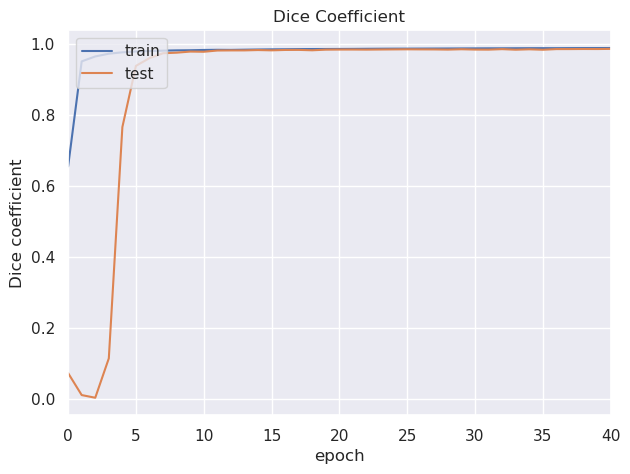

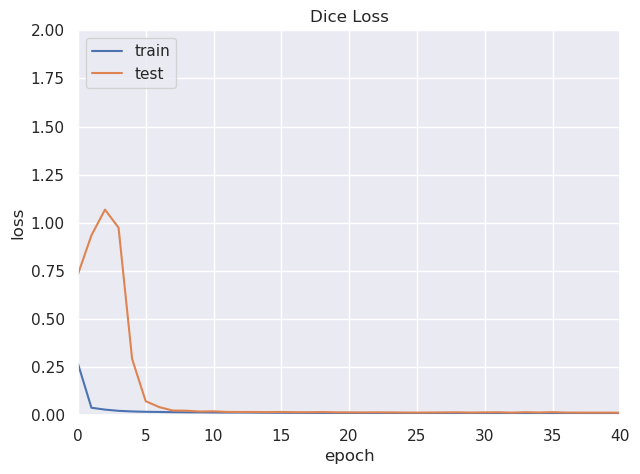

In [51]:
plt.rcParams["axes.grid"] = True
rcParams['figure.figsize'] = 7, 5
plt.xlim(0, 40)
plt.plot(results.history['dice_coeff'])
plt.plot(results.history['val_dice_coeff'])
plt.title('Dice Coefficient')
plt.ylabel('Dice coefficient')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


plt.ylim(0, 2)
plt.xlim(0, 40)
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Dice Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Comparison of normal images

In [ ]:
def compare_actual_and_predicted(image_no):
    rcParams['axes.grid'] = False
    temp = model.predict(new_cts[image_no].reshape(1,new_dim, new_dim, 1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(new_cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(new_lungs[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Predicted mask')

    plt.show()

1/1 [==============================] - 0s 24ms/step


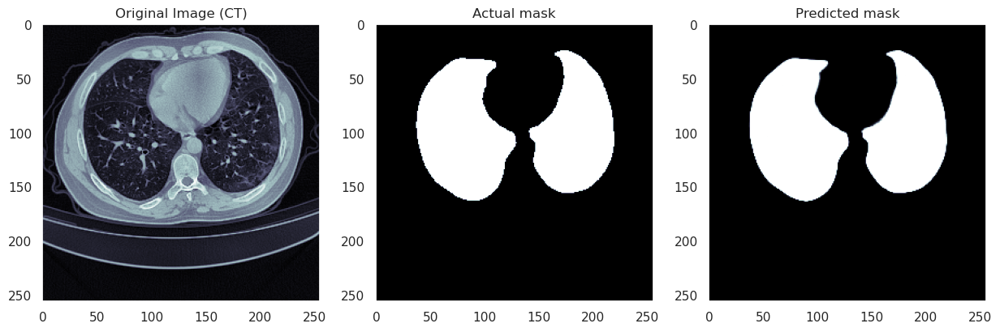

1/1 [==============================] - 0s 37ms/step


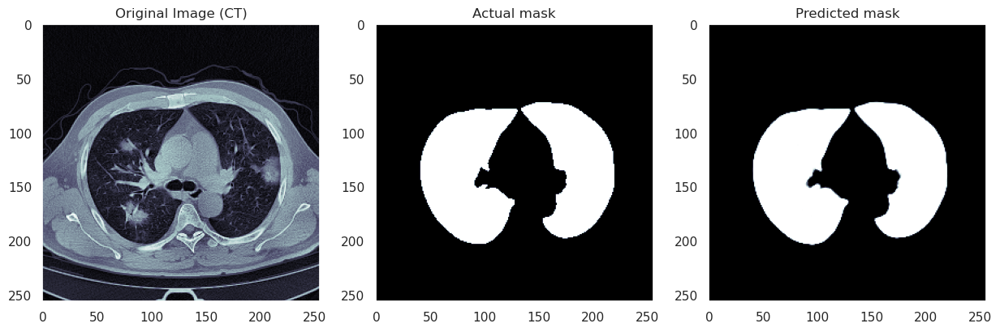

1/1 [==============================] - 0s 43ms/step


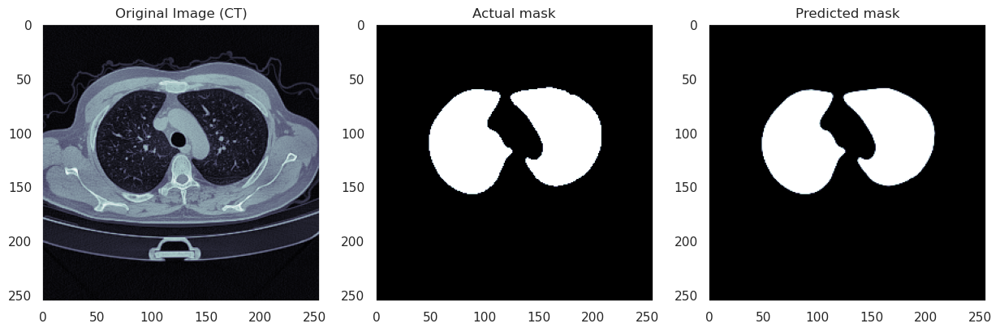

1/1 [==============================] - 0s 24ms/step


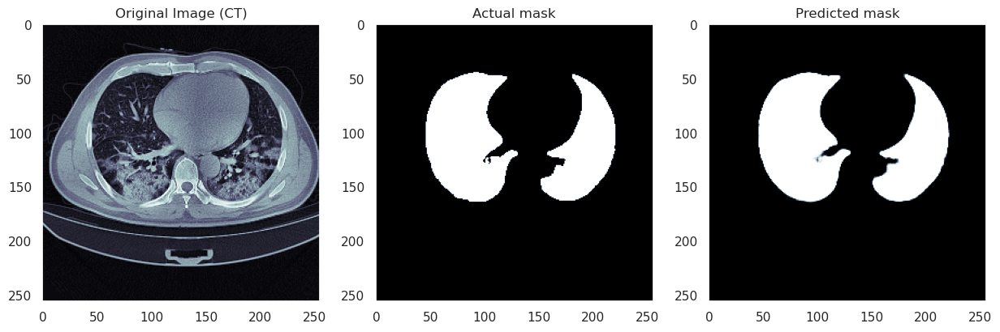

1/1 [==============================] - 0s 25ms/step


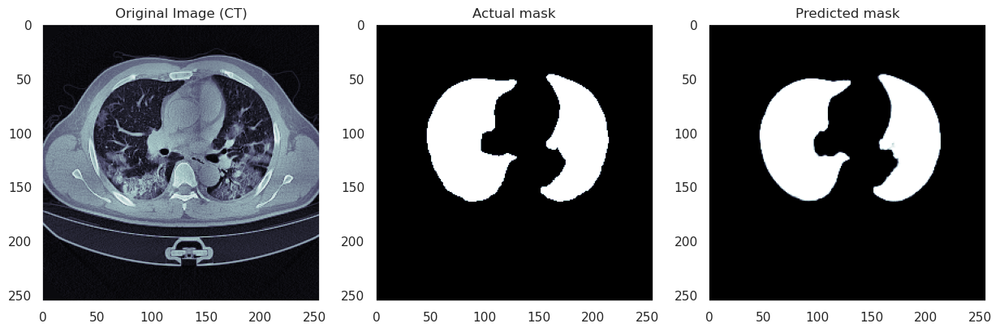

1/1 [==============================] - 0s 24ms/step


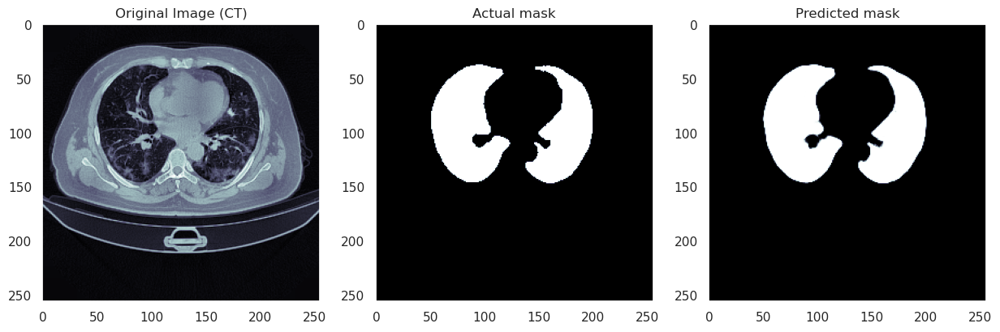

In [45]:
for i in [440,269,555, 355, 380, 90]:
    compare_actual_and_predicted(i)

# Comparison of augmented images

1/1 [==============================] - 0s 26ms/step


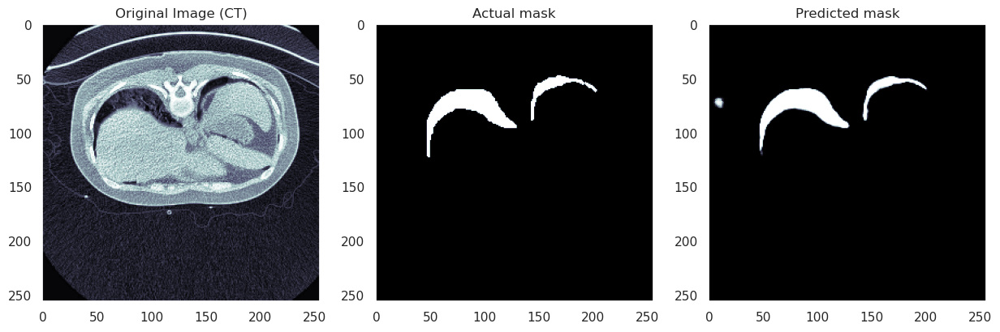

1/1 [==============================] - 0s 24ms/step


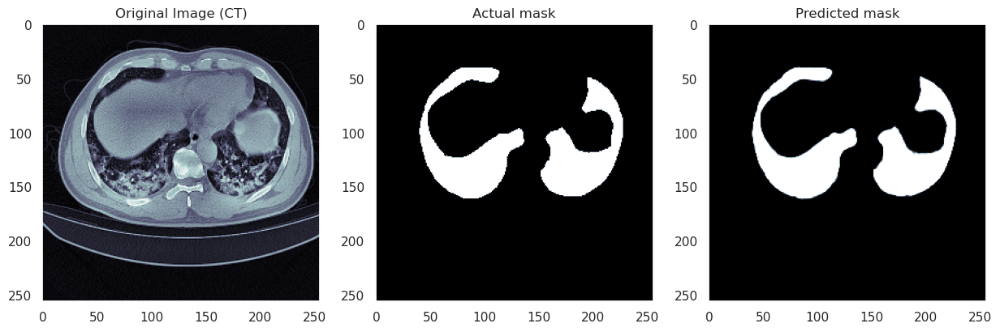

1/1 [==============================] - 0s 23ms/step


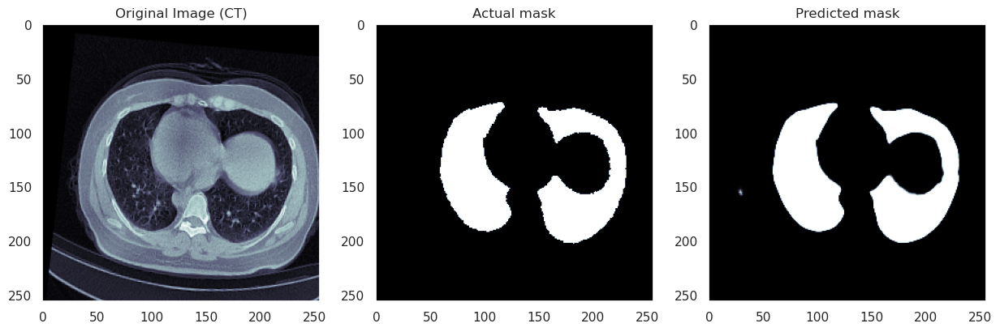

1/1 [==============================] - 0s 24ms/step


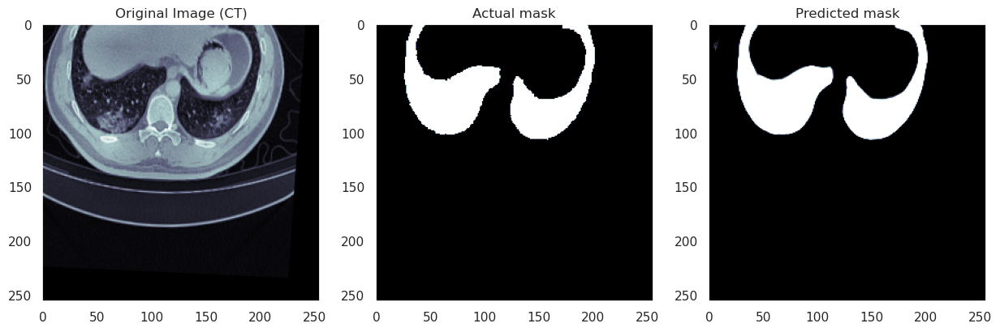

1/1 [==============================] - 0s 24ms/step


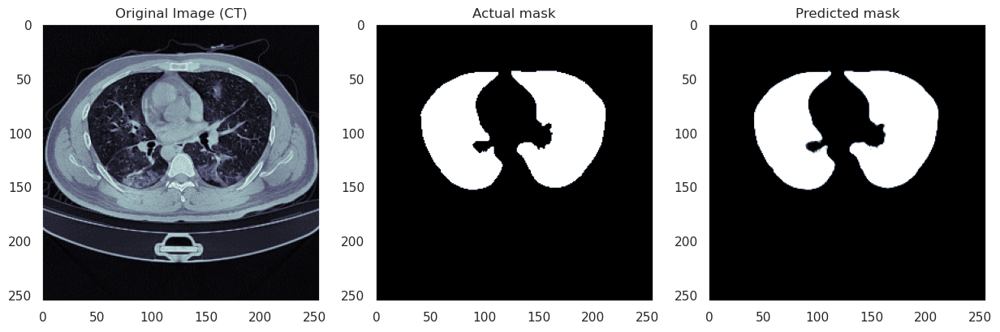

In [46]:
for i in [2001,2200, 2355,2380, 2290]:
    compare_actual_and_predicted(i)